In [58]:
# import libraries
import pandas as pd
# !pip install seaborn
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
# !pip install plotly
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
# from pandas_profiling import ProfileReport
from pandas.plotting import scatter_matrix
#!pip install pm4py
import pm4py
from pm4py.objects.log.util.log import project_traces
from pm4py.objects.log.util import interval_lifecycle
# !pip install zipfile
import zipfile

#!pip install warnings
import warnings
warnings.filterwarnings("ignore")

In [59]:
# load pre-processed data
data = pd.read_csv('../data/bpi_challenge_offer.csv', sep=',')
# data.head()
trace = pm4py.format_dataframe(data, case_id='Case ID', activity_key='Activity', timestamp_key="Start Timestamp")

trace.head()

,Case ID,Activity,Resource,Start Timestamp,Complete Timestamp,Variant,Variant index,lifecycle:transition,EventOrigin,EventID,...,MonthlyCost,Selected,CreditScore,OfferedAmount,OfferID,case:concept:name,concept:name,time:timestamp,@@index,@@case_index
0,Application_1000086665,A_Create Application,User_1,2016-08-03 17:57:21.673000+00:00,2016-08-03 17:57:21.673000+00:00,Variant 2,2,complete,Application,Application_1000086665,...,NaN,NaN,NaN,NaN,NaN,Application_1000086665,A_Create Application,2016-08-03 17:57:21.673000+00:00,0,0
1,Application_1000086665,A_Submitted,User_1,2016-08-03 17:57:21.734000+00:00,2016-08-03 17:57:21.734000+00:00,Variant 2,2,complete,Application,ApplState_161925113,...,NaN,NaN,NaN,NaN,NaN,Application_1000086665,A_Submitted,2016-08-03 17:57:21.734000+00:00,1,0
2,Application_1000086665,A_Concept,User_1,2016-08-03 17:58:28.299000+00:00,2016-08-03 17:58:28.299000+00:00,Variant 2,2,complete,Application,ApplState_385184570,...,NaN,NaN,NaN,NaN,NaN,Application_1000086665,A_Concept,2016-08-03 17:58:28.299000+00:00,2,0
3,Application_1000086665,A_Accepted,User_5,2016-08-05 15:57:07.419000+00:00,2016-08-05 15:57:07.419000+00:00,Variant 2,2,complete,Application,ApplState_856156982,...,NaN,NaN,NaN,NaN,NaN,Application_1000086665,A_Accepted,2016-08-05 15:57:07.419000+00:00,3,0
4,Application_1000086665,O_Create Offer,User_5,2016-08-05 15:59:57.320000+00:00,2016-08-05 15:59:57.320000+00:00,Variant 2,2,complete,Offer,Offer_410892064,...,241.28,False,0.0,5000.0,Offer_410892064,Application_1000086665,O_Create Offer,2016-08-05 15:59:57.320000+00:00,4,0


In [60]:
trace['year'] = pd.DatetimeIndex(trace['time:timestamp']).year
trace['month'] = pd.DatetimeIndex(trace['time:timestamp']).month
trace.head()
trace_log = pm4py.convert_to_event_log(trace)

In [61]:
# To extract target varaible, 
# if event starts with the name decleration rejected it is considered as rejected application
accepted = []
for trace in trace_log:
    flag = False
    for i,event in enumerate(trace):
        if "O_Accepted" in event['concept:name']:
            flag = True
            break
    
    if flag:
        accepted.append(1)
    else:
        accepted.append(0)

In [62]:
# convert logs to dataframe
df = pm4py.convert_to_dataframe(trace_log)
df.head(25)

,Case ID,Activity,Resource,Start Timestamp,Complete Timestamp,Variant,Variant index,lifecycle:transition,EventOrigin,EventID,...,CreditScore,OfferedAmount,OfferID,concept:name,time:timestamp,@@index,@@case_index,year,month,case:concept:name
0,Application_1000086665,A_Create Application,User_1,2016-08-03 17:57:21.673000+00:00,2016-08-03 17:57:21.673000+00:00,Variant 2,2,complete,Application,Application_1000086665,...,NaN,NaN,NaN,A_Create Application,2016-08-03 17:57:21.673000+00:00,0,0,2016,8,Application_1000086665
1,Application_1000086665,A_Submitted,User_1,2016-08-03 17:57:21.734000+00:00,2016-08-03 17:57:21.734000+00:00,Variant 2,2,complete,Application,ApplState_161925113,...,NaN,NaN,NaN,A_Submitted,2016-08-03 17:57:21.734000+00:00,1,0,2016,8,Application_1000086665
2,Application_1000086665,A_Concept,User_1,2016-08-03 17:58:28.299000+00:00,2016-08-03 17:58:28.299000+00:00,Variant 2,2,complete,Application,ApplState_385184570,...,NaN,NaN,NaN,A_Concept,2016-08-03 17:58:28.299000+00:00,2,0,2016,8,Application_1000086665
3,Application_1000086665,A_Accepted,User_5,2016-08-05 15:57:07.419000+00:00,2016-08-05 15:57:07.419000+00:00,Variant 2,2,complete,Application,ApplState_856156982,...,NaN,NaN,NaN,A_Accepted,2016-08-05 15:57:07.419000+00:00,3,0,2016,8,Application_1000086665
4,Application_1000086665,O_Create Offer,User_5,2016-08-05 15:59:57.320000+00:00,2016-08-05 15:59:57.320000+00:00,Variant 2,2,complete,Offer,Offer_410892064,...,0.0,5000.0,Offer_410892064,O_Create Offer,2016-08-05 15:59:57.320000+00:00,4,0,2016,8,Application_1000086665
5,Application_1000086665,O_Created,User_5,2016-08-05 15:59:58.162000+00:00,2016-08-05 15:59:58.162000+00:00,Variant 2,2,complete,Offer,OfferState_2071773136,...,0.0,5000.0,Offer_410892064,O_Created,2016-08-05 15:59:58.162000+00:00,5,0,2016,8,Application_1000086665
6,Application_1000086665,O_Sent (mail and online),User_5,2016-08-05 16:01:23.264000+00:00,2016-08-05 16:01:23.264000+00:00,Variant 2,2,complete,Offer,OfferState_388269514,...,0.0,5000.0,Offer_410892064,O_Sent (mail and online),2016-08-05 16:01:23.264000+00:00,6,0,2016,8,Application_1000086665
7,Application_1000086665,A_Complete,User_5,2016-08-05 16:01:23.288000+00:00,2016-08-05 16:01:23.288000+00:00,Variant 2,2,complete,Application,ApplState_1103800866,...,NaN,NaN,NaN,A_Complete,2016-08-05 16:01:23.288000+00:00,7,0,2016,8,Application_1000086665
8,Application_1000086665,A_Cancelled,User_1,2016-09-05 08:00:36.710000+00:00,2016-09-05 08:00:36.710000+00:00,Variant 2,2,complete,Application,ApplState_544389273,...,NaN,NaN,NaN,A_Cancelled,2016-09-05 08:00:36.710000+00:00,8,0,2016,9,Application_1000086665
9,Application_1000086665,O_Cancelled,User_1,2016-09-05 08:00:36.829000+00:00,2016-09-05 08:00:36.829000+00:00,Variant 2,2,complete,Offer,OfferState_1258287612,...,0.0,5000.0,Offer_410892064,O_Cancelled,2016-09-05 08:00:36.829000+00:00,9,0,2016,9,Application_1000086665


## Feature engineering before visualization 

### Cheking data types

In [63]:
# check type and correct if needed
df.dtypes

Case ID                               object
Activity                              object
Resource                              object
Start Timestamp          datetime64[ns, UTC]
Complete Timestamp       datetime64[ns, UTC]
Variant                               object
Variant index                          int64
lifecycle:transition                  object
EventOrigin                           object
EventID                               object
Action                                object
LoanGoal                              object
ApplicationType                       object
RequestedAmount                      float64
FirstWithdrawalAmount                float64
NumberOfTerms                        float64
Accepted                              object
MonthlyCost                          float64
Selected                              object
CreditScore                          float64
OfferedAmount                        float64
OfferID                               object
concept:na

In [64]:
from sklearn.preprocessing import LabelEncoder

modi_df = df.copy()  # Make a copy to avoid modifying the original DataFrame
# Perform label encoding
label_encoder = LabelEncoder()
modi_df['LoanGoal_encoded'] = label_encoder.fit_transform(modi_df['LoanGoal'])
modi_df['DiffOfferedReq'] = modi_df['OfferedAmount'] - modi_df['RequestedAmount']
modi_df.dtypes 


Case ID                               object
Activity                              object
Resource                              object
Start Timestamp          datetime64[ns, UTC]
Complete Timestamp       datetime64[ns, UTC]
Variant                               object
Variant index                          int64
lifecycle:transition                  object
EventOrigin                           object
EventID                               object
Action                                object
LoanGoal                              object
ApplicationType                       object
RequestedAmount                      float64
FirstWithdrawalAmount                float64
NumberOfTerms                        float64
Accepted                              object
MonthlyCost                          float64
Selected                              object
CreditScore                          float64
OfferedAmount                        float64
OfferID                               object
concept:na

In [65]:
# categoric data
# keeping only low cardinality values
cat_columns = modi_df.select_dtypes(include='object')
cat_columns = cat_columns[['Accepted', 'Selected', 'LoanGoal', 'ApplicationType']]
cat_columns.head()

# numeric data
num_columns = modi_df.select_dtypes(include=['float64', 'int64', 'int32'])
num_columns = num_columns[['RequestedAmount', 'FirstWithdrawalAmount', 'NumberOfTerms',
                            'MonthlyCost', 'CreditScore', 'OfferedAmount', 'LoanGoal_encoded', 'DiffOfferedReq']]
num_columns.head()
#cat_columns.shape, num_columns.shape

,RequestedAmount,FirstWithdrawalAmount,NumberOfTerms,MonthlyCost,CreditScore,OfferedAmount,LoanGoal_encoded,DiffOfferedReq
0,5000.0,NaN,NaN,NaN,NaN,NaN,10,NaN
1,5000.0,NaN,NaN,NaN,NaN,NaN,10,NaN
2,5000.0,NaN,NaN,NaN,NaN,NaN,10,NaN
3,5000.0,NaN,NaN,NaN,NaN,NaN,10,NaN
4,5000.0,5000.0,22.0,241.28,0.0,5000.0,10,0.0


### Removing outliers (???)

In [66]:
filtered_rows = df[df['EventOrigin'] == 'Offer']
len(filtered_rows)

58989

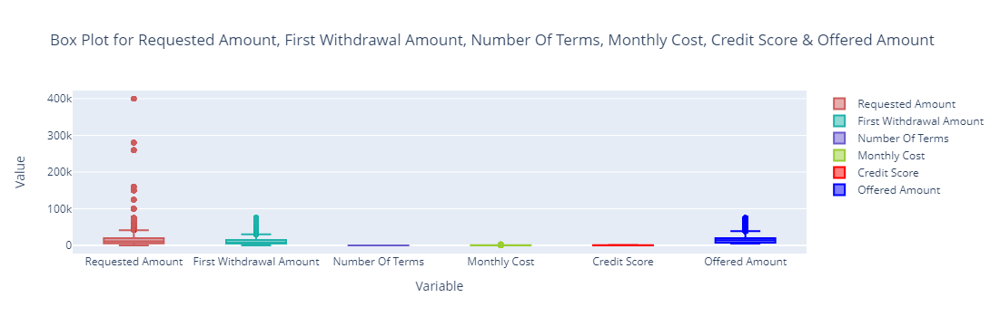

In [67]:
fig = go.Figure()
fig.add_trace(go.Box(y=num_columns['RequestedAmount'], name='Requested Amount',
                marker_color = 'indianred'))
fig.add_trace(go.Box(y=num_columns['FirstWithdrawalAmount'], name = 'First Withdrawal Amount',
                marker_color = 'lightseagreen'))
fig.add_trace(go.Box(y=num_columns['NumberOfTerms'], name='Number Of Terms',
                marker_color = 'slateblue'))
fig.add_trace(go.Box(y=num_columns['MonthlyCost'], name = 'Monthly Cost',
                marker_color = 'yellowgreen'))
fig.add_trace(go.Box(y=num_columns['CreditScore'], name = 'Credit Score',
                marker_color = 'red'))
fig.add_trace(go.Box(y=num_columns['OfferedAmount'], name = 'Offered Amount',
                marker_color = 'blue'))

# Update the layout to show the axis-title
fig.update_layout(xaxis_title='Variable', yaxis_title='Value')

# Update the layout to show the title
fig.update_layout(title="Box Plot for Requested Amount, First Withdrawal Amount, Number Of Terms, Monthly Cost, Credit Score & Offered Amount")

fig.show()


# Visualizations

In [68]:
# old one
#selected_variables = ['FirstWithdrawalAmount', 'NumberOfTerms', 'MonthlyCost', 'CreditScore', 'LoanGoal_encoded', 'DiffOfferedReq']
#selected_num_columns = num_columns[selected_variables]
#selected_num_columns.hist(figsize=(15,10), bins=50)

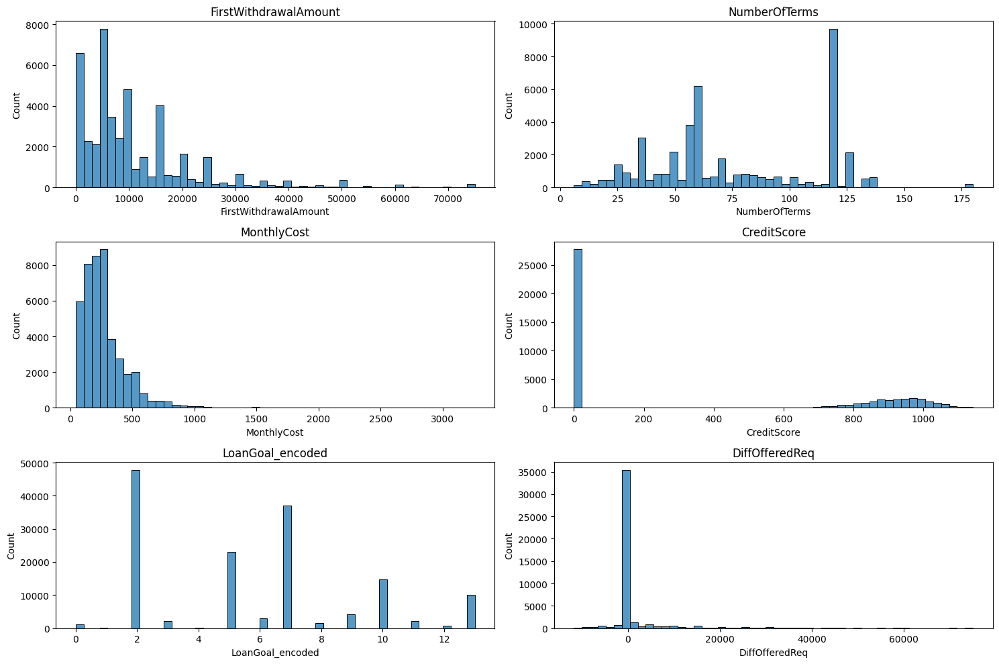

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

selected_variables = ['FirstWithdrawalAmount', 'NumberOfTerms', 'MonthlyCost', 'CreditScore', 'LoanGoal_encoded', 'DiffOfferedReq']
selected_num_columns = num_columns[selected_variables]
# Create a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 10))

# Flatten the axes to iterate over them
axes = axes.flatten()

# Plot histograms for the first 5 variables
for i in range(5):
    sns.histplot(selected_num_columns[selected_variables[i]], bins=50, ax=axes[i])
    axes[i].set_title(selected_variables[i])

# Remove outliers for the last variable and plot the histogram
diff_offered_req_no_outliers = selected_num_columns['DiffOfferedReq'][selected_num_columns['DiffOfferedReq'] > selected_num_columns['DiffOfferedReq'].quantile(0.01)]
sns.histplot(diff_offered_req_no_outliers, bins=50, ax=axes[5])
axes[5].set_title('DiffOfferedReq')

# Add a note below the last plot
#axes[5].text(0.5, -0.2, 'Outliers removed for better visibility', ha='center', va='center', transform=axes[5].transAxes, color='red', fontsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [70]:
import plotly.graph_objects as go

# Assuming num_columns is a DataFrame with the numerical columns you want to plot

for variable in num_columns.columns:
    fig = go.Figure()

    box = go.Box(y=num_columns[variable], name=variable)
    fig.add_trace(box)

    fig.update_layout(
        xaxis_title='Variable',
        yaxis_title='Value',
        title=f"Box Plot for {variable}",
        showlegend=False,  # Set to True if you want to show a legend
        autosize=True,
        width=300,
        height=600,
        margin=dict(l=50, r=50, b=100, t=100, pad=4),
        paper_bgcolor="white"
    )
    # Save the figure as a PNG file using Kaleido engine
    #file_name = f"boxplot2_{variable}.png"
    #pio.write_image(fig, file_name, engine='kaleido')

#    print(f"Saved {file_name}")
#    fig.show()


In [71]:
### Save the figures
#import plotly.graph_objects as go
#import plotly.io as pio

#for variable in num_columns.columns:
#    fig = go.Figure()

#    box = go.Box(y=num_columns[variable], name=variable)
#    fig.add_trace(box)

#    fig.update_layout(
#        xaxis_title='Variable',
#        yaxis_title='Value',
#        title=f"Box Plot for {variable}",
#        showlegend=False,  # Set to True if you want to show a legend
#        autosize=False,
#        width=800,
#        height=600,
#        margin=dict(l=50, r=50, b=100, t=100, pad=4),
#        paper_bgcolor="lightgray",
#    )

    # Save the figure as a PNG file using Kaleido engine
#    file_name = f"boxplot_{variable}.png"
#    pio.write_image(fig, file_name, engine='kaleido')

#    print(f"Saved {file_name}")


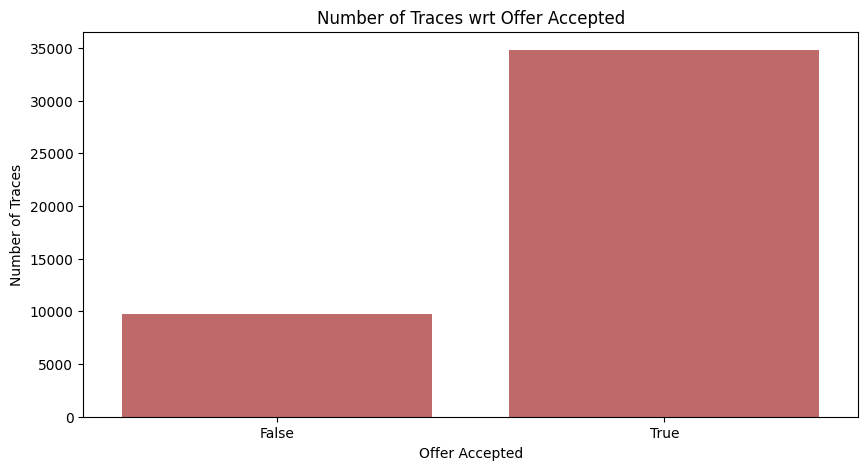

In [72]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot()
temp = filtered_rows['Accepted'].value_counts()
grid = sns.barplot(x=temp.index, y=temp.values, color ='indianred')


ax.set_xlabel("Offer Accepted")  # set x-axis label
ax.set_ylabel("Number of Traces") # set y-axis label
plt.title('Number of Traces wrt Offer Accepted')
plt.savefig("Number of Traces wrt Offer Accepted.png")

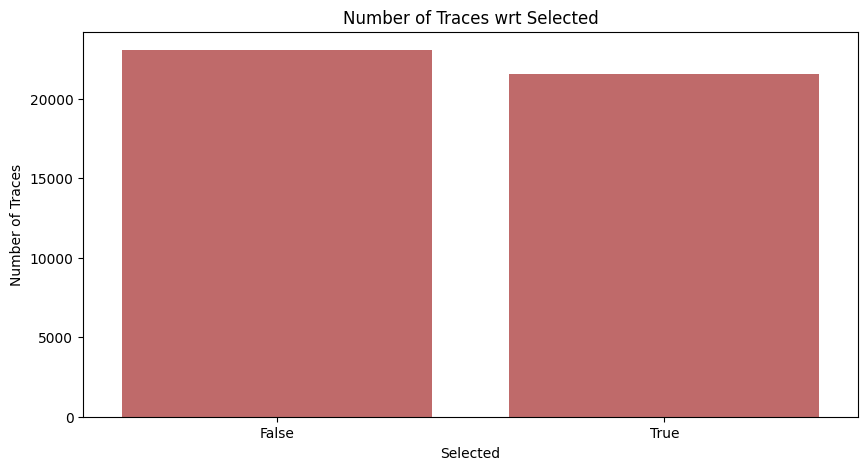

In [73]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot()
temp = filtered_rows['Selected'].value_counts()
grid = sns.barplot(x=temp.index, y=temp.values, color ='indianred')


ax.set_xlabel("Selected")  # set x-axis label
ax.set_ylabel("Number of Traces") # set y-axis label
plt.title('Number of Traces wrt Selected')
plt.savefig("Number of Traces wrt Selected.png")

Text(0.5, 1.0, 'Heatmap')

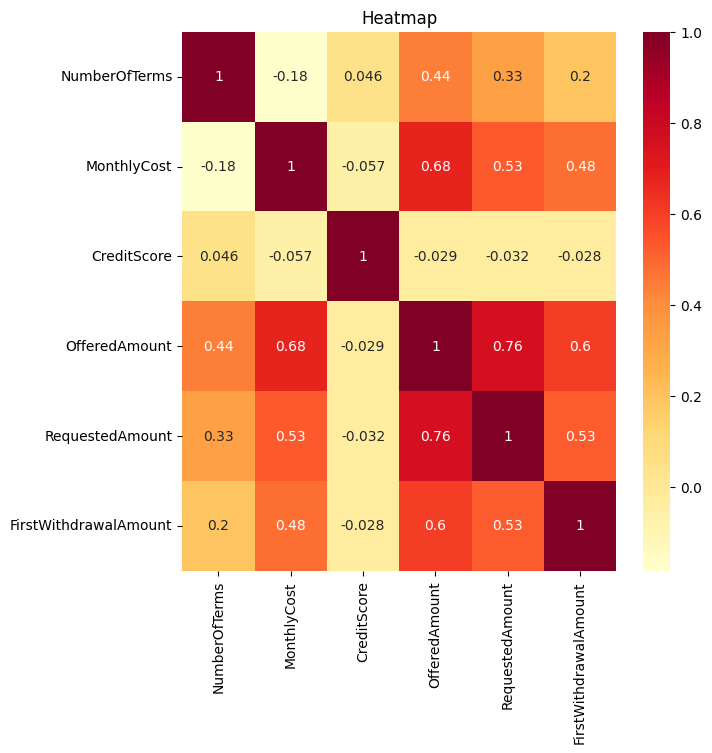

In [74]:
# subset of num variables
selected_variables = ['NumberOfTerms', 'MonthlyCost', 'CreditScore', 'OfferedAmount', 'RequestedAmount', 'FirstWithdrawalAmount']
# Select only the specified variables from num_columns
selected_num_columns = num_columns[selected_variables]

# plotting heat map between numeric variables
fig, ax = plt.subplots(figsize=(7,7)) 
sns.heatmap(selected_num_columns.corr(), annot=True, ax = ax, cmap='YlOrRd')
plt.title('Heatmap')
#plt.savefig("Feature_Heatmap.png")     already saved

array([[<Axes: title={'center': 'RequestedAmount'}>,
        <Axes: title={'center': 'FirstWithdrawalAmount'}>],
       [<Axes: title={'center': 'NumberOfTerms'}>,
        <Axes: title={'center': 'MonthlyCost'}>],
       [<Axes: title={'center': 'CreditScore'}>,
        <Axes: title={'center': 'OfferedAmount'}>]], dtype=object)

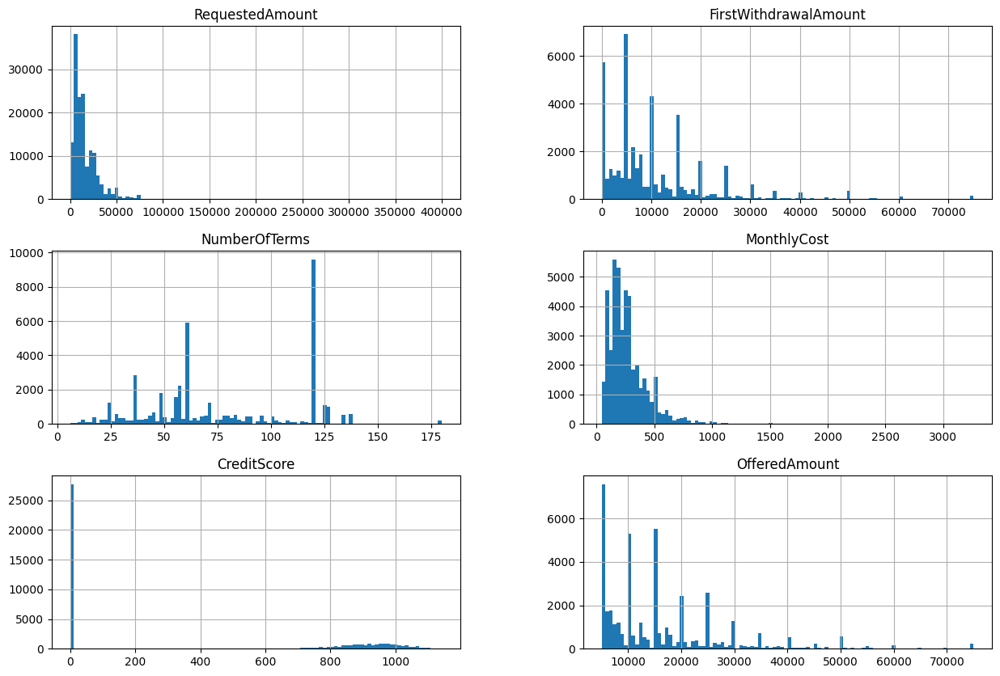

In [75]:
selected_variables = ['RequestedAmount', 'FirstWithdrawalAmount', 'NumberOfTerms', 'MonthlyCost', 'CreditScore', 'OfferedAmount']
selected_num_columns = num_columns[selected_variables]
selected_num_columns.hist(figsize=(15,10), bins=100)


Text(0, 0.5, 'Number of Traces')

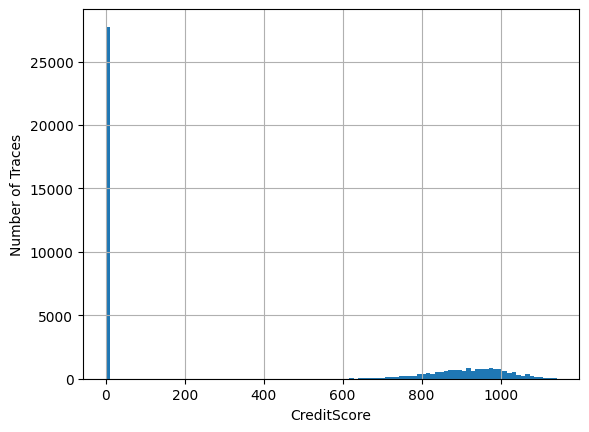

In [76]:
# labeled axis hist of NumberOfTerms
selected_num_columns['CreditScore'].hist(bins=100)
plt.xlabel('CreditScore')
plt.ylabel('Number of Traces')


In [77]:
import numpy as np
import pandas as pd

# Assuming selected_num_columns is a DataFrame with the 'MonthlyCost' column

# Example data (replace this with your actual data)
monthly_cost_data = selected_num_columns['MonthlyCost']

# Calculate the interquartile range (IQR)
q1 = np.nanpercentile(monthly_cost_data, 25)
q3 = np.nanpercentile(monthly_cost_data, 75)
iqr = q3 - q1

# Filter values within the IQR
values_within_iqr = monthly_cost_data[(monthly_cost_data >= q1) & (monthly_cost_data <= q3)]

# Compute the mean of values within the IQR
mean_within_iqr = np.nanmean(values_within_iqr)

print("Interquartile Range (IQR) for MonthlyCost:", iqr)
print("Values within IQR for MonthlyCost:", values_within_iqr.tolist())
print("Mean within IQR for MonthlyCost:", mean_within_iqr)


Interquartile Range (IQR) for MonthlyCost: 181.98000000000002
Values within IQR for MonthlyCost: [241.28, 241.28, 241.28, 241.28, 250.0, 213.21, 213.21, 213.21, 213.21, 213.21, 230.66, 230.66, 230.66, 230.66, 180.0, 153.93, 153.93, 153.93, 153.93, 153.93, 163.64, 163.64, 163.64, 163.64, 300.0, 157.59, 157.59, 157.59, 157.59, 250.0, 300.0, 195.21, 195.21, 195.21, 195.21, 280.0, 280.0, 280.0, 280.0, 280.0, 200.0, 189.08, 189.08, 189.08, 189.08, 189.08, 200.0, 260.0, 200.0, 300.0, 154.11, 154.11, 154.11, 154.11, 154.11, 264.0, 250.0, 292.86, 292.86, 292.86, 292.86, 292.86, 270.0, 270.0, 204.78, 204.78, 204.78, 204.78, 204.78, 222.31, 222.31, 222.31, 222.31, 291.87, 291.87, 291.87, 291.87, 200.0, 300.0, 300.0, 300.0, 300.0, 300.0, 199.61, 199.61, 199.61, 199.61, 199.61, 334.05, 334.05, 334.05, 334.05, 334.05, 301.14, 300.0, 300.0, 300.0, 300.0, 300.0, 222.31, 222.31, 222.31, 222.31, 277.45, 277.45, 277.45, 277.45, 277.45, 254.56, 254.56, 254.56, 254.56, 254.56, 200.0, 250.0, 296.2, 296.2, 

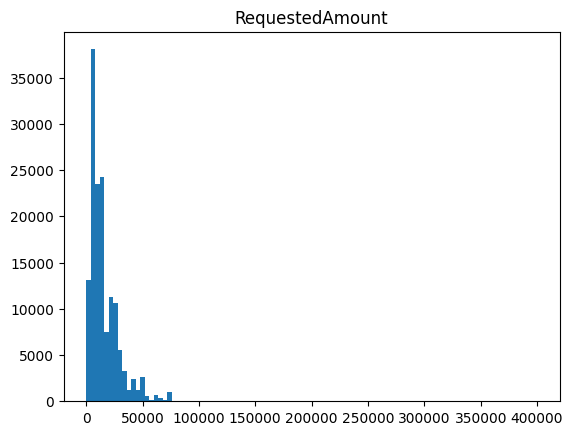

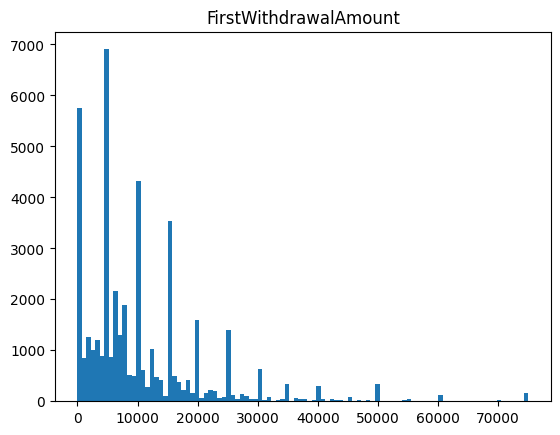

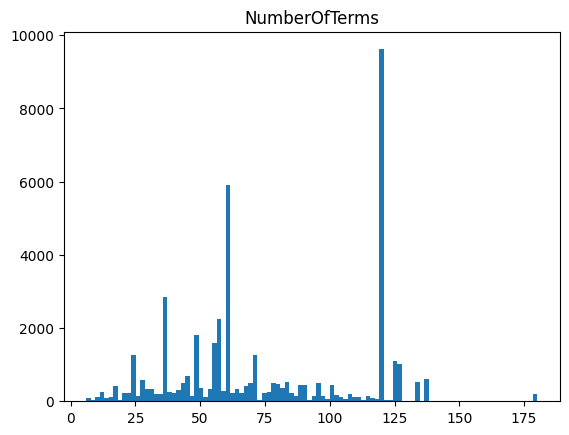

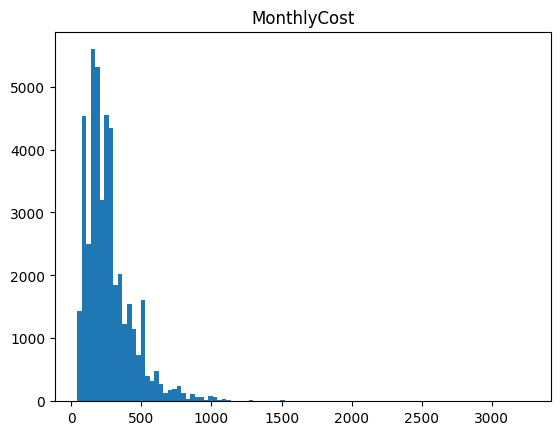

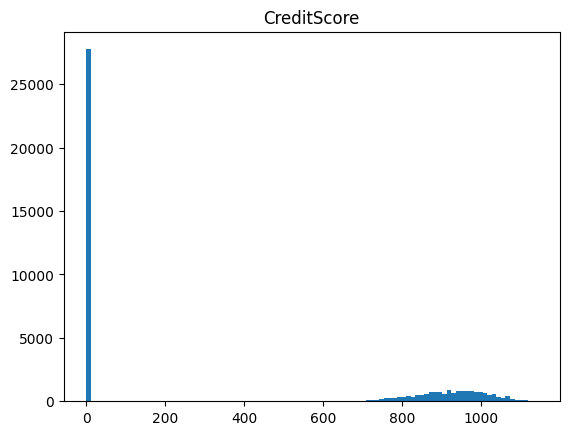

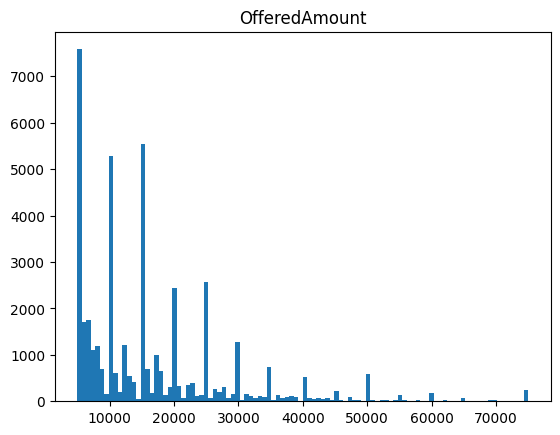

In [78]:
for el in selected_num_columns.columns:
    fig = plt.figure()
    plt.title(f"{el}")
    plt.hist(selected_num_columns[el], bins=100)

## Random Forest Implementation

In [99]:
# check data
num_columns[["DiffOfferedReq", "FirstWithdrawalAmount", "MonthlyCost", "NumberOfTerms", "LoanGoal_encoded"]].head()


,DiffOfferedReq,FirstWithdrawalAmount,MonthlyCost,NumberOfTerms,LoanGoal_encoded
0,NaN,NaN,NaN,NaN,10
1,NaN,NaN,NaN,NaN,10
2,NaN,NaN,NaN,NaN,10
3,NaN,NaN,NaN,NaN,10
4,0.0,5000.0,241.28,22.0,10


In [100]:
# concatenate feature columns and target column
data = pd.concat([cat_columns[["Selected"]], 
                             num_columns[["DiffOfferedReq", "FirstWithdrawalAmount", "MonthlyCost", 
                                          "NumberOfTerms", "LoanGoal_encoded"]]], axis=1)
# drop rows with missing values
data = data.dropna()
print(data)

       Selected  DiffOfferedReq  FirstWithdrawalAmount  MonthlyCost  \
4         False             0.0                 5000.0       241.28   
5         False             0.0                 5000.0       241.28   
6         False             0.0                 5000.0       241.28   
9         False             0.0                 5000.0       241.28   
15         True             0.0                    0.0       250.00   
...         ...             ...                    ...          ...   
147715     True             0.0                30000.0       349.13   
147716     True             0.0                30000.0       349.13   
147717     True             0.0                30000.0       349.13   
147720     True             0.0                30000.0       349.13   
147722     True             0.0                30000.0       349.13   

        NumberOfTerms  LoanGoal_encoded  
4                22.0                10  
5                22.0                10  
6                22.0

In [101]:
from sklearn.model_selection import train_test_split
dataFrame=data.copy()
new_y=dataFrame.pop('Selected').values
new_x=dataFrame.values
X_train,X_test,y_train,y_test=train_test_split(new_x,new_y,test_size=0.7,random_state=1)
y_train = data['Selected']
y_train = np.array(y_train).astype(int) # make sure it is an np.array and not a series
X_train = data.drop(["Selected"], axis=1)
y_test = data['Selected']
y_test = np.array(y_test).astype(int) # make sure it is an np.array and not a series
X_test = data.drop(["Selected"], axis=1)

In [102]:
# create target variable for prediction
import numpy as np
y = data['Selected']
y = np.array(y).astype(int) # make sure it is an np.array and not a series
x = data.drop(["Selected"], axis=1)

In [83]:
# test implementation of Random Forest Classifier (seed = 0) 
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=0)

# fit the model
clf.fit(x, y)
#RandomForestClassifier(random_state=0)

# predict
clf.predict(x)

array([0, 0, 0, ..., 1, 1, 1])

In [84]:
randomForestModel=RandomForestClassifier(n_estimators=75)
randomForestModel.fit(X_train,y_train)
y_pred=randomForestModel.predict(X_test)

In [85]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import jaccard_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
import plotly.express as px
from sklearn import metrics

Random Forest Evaluation

In [86]:
print('Accuracy Score: ',accuracy_score(y_test,y_pred))
print('Recall Score: ',recall_score(y_test,y_pred))
print('Jaccard Score: ',jaccard_score(y_test,y_pred))
print('F1 Score: ',f1_score(y_test,y_pred))
print('Precision Score: ',precision_score(y_test,y_pred))
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

plot = px.imshow(np.around(confusion_matrix(y_test, y_pred, normalize='true'),3), 
                template='simple_white',
                text_auto=True, 
                aspect="True", 
                labels=dict(x="Predicted Label", y="Correct Label", color='Value'))
plot.update_xaxes(side="bottom")
plot.show()

Accuracy Score:  0.8805213450882742
Recall Score:  0.8452712746191007
Jaccard Score:  0.773583301449645
F1 Score:  0.8723394055608821
Precision Score:  0.9011984944532488
Accuracy: 0.8805213450882742


## Feature Importance

<Axes: >

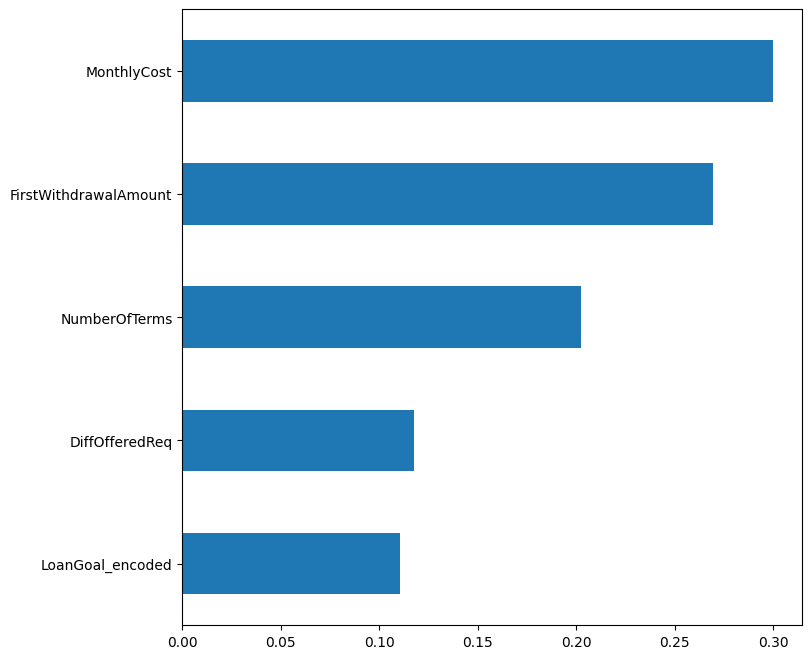

In [87]:
df_new = data.drop('Selected', axis=1)

var_imp = pd.DataFrame({'importance': clf.feature_importances_},
                       index=df_new.columns)

var_imp.sort_values(by='importance').plot.barh(figsize=(8,8),
                                               legend=False)

In [88]:
print(var_imp.sort_values(by='importance'))
#selected_variables = ['RequestedAmount', 'FirstWithdrawalAmount', 'NumberOfTerms', 'MonthlyCost', 'CreditScore', 'OfferedAmount']
#selected_columns = df_new[selected_variables]
#selected_columns.hist(figsize=(15,10), bins=100)

                       importance
LoanGoal_encoded         0.110784
DiffOfferedReq           0.117477
NumberOfTerms            0.202446
FirstWithdrawalAmount    0.269518
MonthlyCost              0.299775


## Random forest evaluation w/ 5-fold CV(60%)

In [103]:
# Implementation of Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=0)

# fit model with 5-fold Cross Validation
from sklearn.model_selection import cross_validate
result = cross_validate(clf, x, y)  # (defaults) is 5-fold CV

In [ ]:
# print evaluation metrics
print('fit_time:', result['fit_time'])
print('score_time:', result['score_time'])
print('test_score:', result['test_score'])
print('mean accuracy:', sum(result['test_score']) / len(result['test_score']))

fit_time: [8.29017639 6.73506331 6.88488102 6.537637   7.34394383]
score_time: [0.23251915 0.19169521 0.19473386 0.18619084 0.20861554]
test_score: [0.60531629 0.60991476 0.62131239 0.6087493  0.59035334]
mean accuracy: 0.6071292152317372


## GBC

In [91]:
from  sklearn.model_selection  import  cross_val_score 
import  multiprocessing
from sklearn.ensemble import GradientBoostingClassifier
from  sklearn.metrics  import  mean_squared_error 



In [ ]:
# Parameter Tuning (30 minutes)
train_scores  =  [] 
cv_scores     =  []

estimator_range  =  range ( 1 ,  200, 3 )
learning_rate = [0.001, 0.01, 0.03, 0.05, 0.1]

listGB=[]
for n_learning_rate in learning_rate : 
        for n_estimators  in  estimator_range :
    
                model  =  GradientBoostingClassifier ( 
                        n_estimators  =  n_estimators , 
                        learning_rate = n_learning_rate, 
                        max_features  =  'auto' , 
                        random_state  =  100 
                )
    
    
                model.fit(X_train, y_train)
                predictions  =  model.predict ( X  =  X_train ) 
                rmse  =  mean_squared_error ( 
                        y_true   =  y_train , 
                        y_pred   =  predictions , 
                        squared  =  False 
                ) 
                train_scores.append ( rmse )
    
                scores  =  cross_val_score ( 
                        estimator  =  model , 
                        X          =  X_train , 
                        y          =  y_train , 
                        scoring    =  'neg_root_mean_squared_error' , 
                        cv         =  5 , 
                        n_jobs     =  multiprocessing.cpu_count ()  -  1 , 
                ) 
                cv_scores.append( -1 * np.mean(scores))
    
        listGB.append(f"Optimal value of n_estimators with n_learning_rate: {estimator_range[np.argmin(cv_scores)]} , {n_learning_rate}, {min ( cv_scores )}")
        cv_scores.clear()
        
for item in listGB:
        print(item)



In [93]:
gbc = GradientBoostingClassifier(n_estimators=196,
                                 learning_rate=0.1,
                                 random_state=100)
# Fit to training set
gbc.fit(X_train, y_train)
 
# Predict on test set
pred_y = gbc.predict(X_test)
 
# accuracy
acc = accuracy_score(y_test, pred_y)
print("Gradient Boosting Classifier accuracy is : {:.2f}".format(acc))

Gradient Boosting Classifier accuracy is : 0.68


In [96]:
# Compute evaluation metrics
accuracy = gbc.score(X_test, y_test)
recall = recall_score(y_test, pred_y)
jaccard = jaccard_score(y_test, pred_y)
f1 = f1_score(y_test, pred_y)
precision = precision_score(y_test, pred_y)

# Print the evaluation metrics
print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"Jaccard: {jaccard}")
print(f"F1: {f1}")
print(f"Precision: {precision}")
print("Accuracy:",metrics.accuracy_score(y_test, pred_y))

plot = px.imshow(np.around(confusion_matrix(y_test, pred_y, normalize='true'),3), 
                template='simple_white',
                text_auto=True, 
                aspect="True", 
                labels=dict(x="Predicted Label", y="Correct Label", color='Value'))
plot.update_xaxes(side="bottom")
plot.show()

Accuracy: 0.6840747470668731
Recall: 0.6124117428465254
Jaccard: 0.48351487145633915
F1: 0.6518503868878397
Precision: 0.696718279342599
Accuracy: 0.6840747470668731


<Axes: >

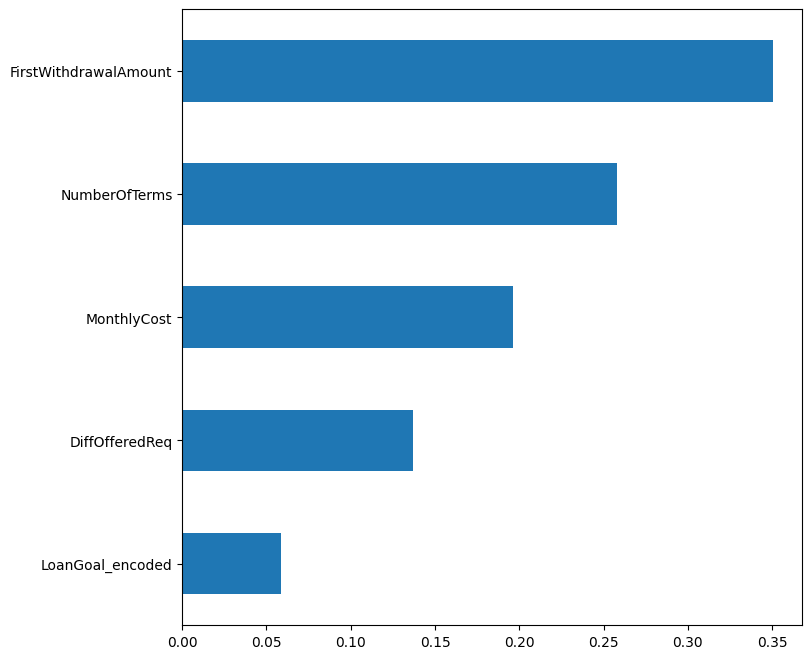

In [97]:
df_new = data.drop('Selected', axis=1)

var_imp = pd.DataFrame({'importance': gbc.feature_importances_},
                       index=df_new.columns)

var_imp.sort_values(by='importance').plot.barh(figsize=(8,8),
                                               legend=False)